In [1]:
import os,pandas as pd,numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score
from sklearn import tree , metrics, preprocessing

In [2]:
%matplotlib inline 
from IPython.display import Image
import matplotlib as mlp
import matplotlib.pyplot as plt
import seaborn as sns
import graphviz

In [3]:
os.chdir("E:\\Amolya\\1 My notes onData science and machine learning\\Ppt\\ppt2")

In [4]:
hmeq = pd.read_excel("HMEQ.xlsx")

In [5]:
hmeq.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0
3,1,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0


In [6]:
hmeq.JOB.value_counts()

Other      2388
ProfExe    1276
Office      948
Mgr         767
Self        193
Sales       109
Name: JOB, dtype: int64

In [7]:
# Discreet value integer encoder - one-hot encoding
label_encoder = preprocessing.LabelEncoder()
hmeq['JOB'] = label_encoder.fit_transform(hmeq['JOB'])

In [8]:
hmeq.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO
0,1,1100,25860.0,39025.0,HomeImp,2,10.5,0.0,0.0,94.366667,1.0,9.0
1,1,1300,70053.0,68400.0,HomeImp,2,7.0,0.0,2.0,121.833333,0.0,14.0
2,1,1500,13500.0,16700.0,HomeImp,2,4.0,0.0,0.0,149.466667,1.0,10.0
3,1,1500,NaN,NaN,NaN,6,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,1,3.0,0.0,0.0,93.333333,0.0,14.0


In [9]:
hmeq.REASON.value_counts()

DebtCon    3928
HomeImp    1780
Name: REASON, dtype: int64

In [10]:
hmeq["REASON"] = np.where(hmeq["REASON"]=="DebtCon",1,0)

In [11]:
hmeq["REASON"].value_counts()

1    3928
0    2032
Name: REASON, dtype: int64

In [12]:
hmeq.shape

(5960, 12)

In [13]:
hmeq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5960 entries, 0 to 5959
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BAD      5960 non-null   int64  
 1   LOAN     5960 non-null   int64  
 2   MORTDUE  5442 non-null   float64
 3   VALUE    5848 non-null   float64
 4   REASON   5960 non-null   int32  
 5   JOB      5960 non-null   int32  
 6   YOJ      5445 non-null   float64
 7   DEROG    5252 non-null   float64
 8   DELINQ   5380 non-null   float64
 9   CLAGE    5652 non-null   float64
 10  NINQ     5450 non-null   float64
 11  CLNO     5738 non-null   float64
dtypes: float64(8), int32(2), int64(2)
memory usage: 512.3 KB


In [15]:
hmeq.isnull().sum()

BAD          0
LOAN         0
MORTDUE    518
VALUE      112
REASON       0
JOB          0
YOJ        515
DEROG      708
DELINQ     580
CLAGE      308
NINQ       510
CLNO       222
dtype: int64

In [16]:
hmeq1= hmeq.dropna()

In [17]:
hmeq1.isnull().sum()

BAD        0
LOAN       0
MORTDUE    0
VALUE      0
REASON     0
JOB        0
YOJ        0
DEROG      0
DELINQ     0
CLAGE      0
NINQ       0
CLNO       0
dtype: int64

In [18]:
hmeq.shape

(5960, 12)

In [19]:
hmeq1.shape

(4438, 12)

In [20]:
hmeq1.head(25)

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO
0,1,1100,25860.0,39025.0,0,2,10.5,0.0,0.0,94.366667,1.0,9.0
1,1,1300,70053.0,68400.0,0,2,7.0,0.0,2.0,121.833333,0.0,14.0
2,1,1500,13500.0,16700.0,0,2,4.0,0.0,0.0,149.466667,1.0,10.0
4,0,1700,97800.0,112000.0,0,1,3.0,0.0,0.0,93.333333,0.0,14.0
5,1,1700,30548.0,40320.0,0,2,9.0,0.0,0.0,101.466002,1.0,8.0
6,1,1800,48649.0,57037.0,0,2,5.0,3.0,2.0,77.100000,1.0,17.0
7,1,1800,28502.0,43034.0,0,2,11.0,0.0,0.0,88.766030,0.0,8.0
8,1,2000,32700.0,46740.0,0,2,3.0,0.0,2.0,216.933333,1.0,12.0
11,1,2000,20627.0,29800.0,0,1,11.0,0.0,1.0,122.533333,1.0,9.0
12,1,2000,45000.0,55000.0,0,2,3.0,0.0,0.0,86.066667,2.0,25.0


In [21]:
hmeq.BAD.value_counts()

0    4771
1    1189
Name: BAD, dtype: int64

In [24]:
(1189/(1189+4771))*100

19.949664429530202

In [25]:
hmeq1.BAD.value_counts(normalize = True)*100

0    80.35151
1    19.64849
Name: BAD, dtype: float64

In [26]:
from sklearn import preprocessing

In [28]:
X = hmeq1.drop(columns="BAD")
Y = hmeq1.BAD

In [29]:
X.head()

,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO
0,1100,25860.0,39025.0,0,2,10.5,0.0,0.0,94.366667,1.0,9.0
1,1300,70053.0,68400.0,0,2,7.0,0.0,2.0,121.833333,0.0,14.0
2,1500,13500.0,16700.0,0,2,4.0,0.0,0.0,149.466667,1.0,10.0
4,1700,97800.0,112000.0,0,1,3.0,0.0,0.0,93.333333,0.0,14.0
5,1700,30548.0,40320.0,0,2,9.0,0.0,0.0,101.466002,1.0,8.0


In [30]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import accuracy_score
from sklearn import tree , metrics, preprocessing

In [31]:
X_train, X_test, y_train, y_test = train_test_split( X, Y, test_size = 0.2, random_state = 100)

In [32]:
# Instantiate model with 1000 decision trees max features is square root of 19 so 4*4 =16 so it took 4
clf = RandomForestClassifier(n_estimators = 1000, random_state = 42,max_features=4)
# Train the model on training data
clf.fit(X_train, y_train)

RandomForestClassifier(max_features=4, n_estimators=1000, random_state=42)

In [33]:
len(clf.estimators_) # number of trees

1000

In [34]:
# https://www.kaggle.com/willkoehrsen/visualize-a-decision-tree-w-python-scikit-learn
from sklearn.tree import export_graphviz
os.environ["PATH"] += os.pathsep + 'E:\\Machine learning course\\Raw data\\graphviz-2.38\\release\\bin'
estimator = clf.estimators_[999] # number of trees to visualise
# Export as dot file
export_graphviz(estimator, out_file='RandomForest.dot', 
                feature_names = X_train.columns,
                #class_names = y_train.columns,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# file will be saved in current working directory

In [35]:
from subprocess import call
!dot -Tpng RandomForest.dot -o tree_limited.png -Gdpi=200
from IPython.display import Image
Image(filename ='tree_limited.png')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.979084 to fit


In [36]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X_train.columns,
                                    columns=['importance']).sort_values('importance', 
                                                                        ascending=False)

In [37]:
feature_importances  #root node is CLAGE

,importance
CLAGE,0.138765
VALUE,0.125780
DELINQ,0.119078
LOAN,0.117762
CLNO,0.107172
MORTDUE,0.106545
YOJ,0.081515
DEROG,0.078409
NINQ,0.065015
JOB,0.044197


In [38]:
importances = clf.feature_importances_  # Gini importance.

[0.11776179 0.1065451  0.12578005 0.01576207 0.04419702 0.08151541
 0.07840854 0.11907821 0.13876459 0.06501547 0.10717177]


<AxesSubplot:>

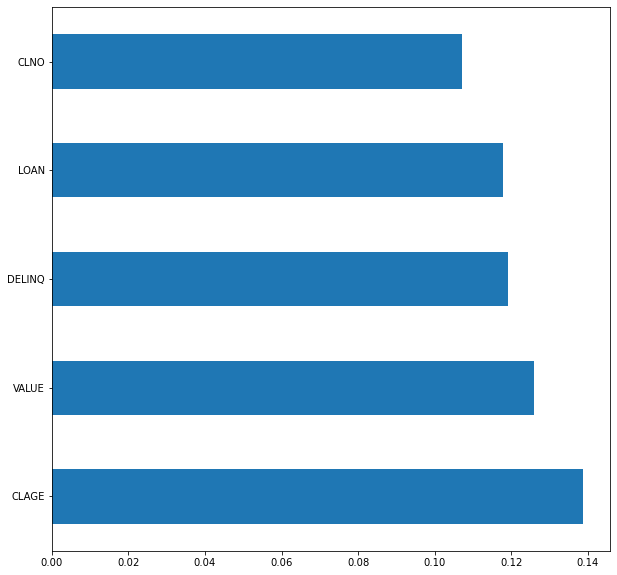

In [39]:
# Get Feature Importance from the classifier
feature_importance = clf.feature_importances_
print (clf.feature_importances_)
feat_importances = pd.Series(clf.feature_importances_, index=X_train.columns)
feat_importances = feat_importances.nlargest(5)
feat_importances.plot(kind='barh' , figsize=(10,10)) 

In [40]:
importances

array([0.11776179, 0.1065451 , 0.12578005, 0.01576207, 0.04419702,
       0.08151541, 0.07840854, 0.11907821, 0.13876459, 0.06501547,
       0.10717177])

In [41]:
indices = np.argsort(importances)[::-1]

In [42]:
indices  

array([ 8,  2,  7,  0, 10,  1,  5,  6,  9,  4,  3], dtype=int64)

In [43]:
for f in range(X.shape[1]):
    if importances[indices[f]] > 0:
        print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))
        print ("feature name: ", X.columns[indices[f]])

1. feature 8 (0.138765)
feature name:  CLAGE
2. feature 2 (0.125780)
feature name:  VALUE
3. feature 7 (0.119078)
feature name:  DELINQ
4. feature 0 (0.117762)
feature name:  LOAN
5. feature 10 (0.107172)
feature name:  CLNO
6. feature 1 (0.106545)
feature name:  MORTDUE
7. feature 5 (0.081515)
feature name:  YOJ
8. feature 6 (0.078409)
feature name:  DEROG
9. feature 9 (0.065015)
feature name:  NINQ
10. feature 4 (0.044197)
feature name:  JOB
11. feature 3 (0.015762)
feature name:  REASON


In [44]:
# use the model to make predictions with the test data
y_pred = clf.predict(X_test)

In [45]:
y_pred

array([0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [46]:
# combining 2 numpy arrays into one pandas dataframe
final_model_predictions = pd.DataFrame({'Actual':y_test, 'predictions':y_pred})

In [47]:
final_model_predictions.head()

,Actual,predictions
1665,0,0
5643,0,0
2267,1,0
2921,0,0
5187,1,1


In [48]:
# how did our model perform?
count_misclassified = (y_test != y_pred).sum()
print('Misclassified samples: {}'.format(count_misclassified))
accuracy = metrics.accuracy_score(y_test, y_pred)
print('Accuracy: {:.2f}'.format(accuracy))


Misclassified samples: 75
Accuracy: 0.92


In [50]:
y_pred_prob = clf.predict_proba(X_test)  # 2  columns for probability it is creating

In [51]:
y_pred_prob #97% goes to 0 and 0.021% chance to go 1

array([[0.979, 0.021],
       [0.98 , 0.02 ],
       [0.501, 0.499],
       ...,
       [0.961, 0.039],
       [0.101, 0.899],
       [0.564, 0.436]])

In [52]:
y_pred_prob = clf.predict_proba(X_test)[:, 1]   

In [53]:
y_pred_prob

array([0.021, 0.02 , 0.499, 0.022, 0.95 , 0.009, 0.03 , 0.009, 0.867,
       0.856, 0.387, 0.002, 0.01 , 0.007, 0.089, 0.179, 0.038, 0.023,
       0.019, 0.013, 0.027, 0.021, 0.029, 0.85 , 0.136, 0.036, 0.013,
       0.006, 0.539, 0.181, 0.017, 0.01 , 0.081, 0.881, 0.047, 0.022,
       0.018, 0.048, 0.023, 0.078, 0.061, 0.249, 0.003, 0.137, 0.02 ,
       0.06 , 0.062, 0.018, 0.014, 0.013, 0.466, 0.133, 0.006, 0.035,
       0.042, 0.006, 0.142, 0.973, 0.197, 0.023, 0.028, 0.047, 0.85 ,
       0.432, 0.108, 0.847, 0.093, 0.01 , 0.057, 0.164, 0.05 , 0.051,
       0.007, 0.177, 0.005, 0.025, 0.612, 0.865, 0.058, 0.036, 0.633,
       0.026, 0.095, 0.537, 0.055, 0.149, 0.033, 0.013, 0.055, 0.015,
       0.229, 0.613, 0.114, 0.043, 0.01 , 0.57 , 0.063, 0.032, 0.237,
       0.034, 0.013, 0.096, 0.019, 0.005, 0.042, 0.147, 0.031, 0.036,
       0.012, 0.13 , 0.107, 0.018, 0.078, 0.018, 0.063, 0.249, 0.52 ,
       0.136, 0.121, 0.038, 0.031, 0.656, 0.104, 0.031, 0.306, 0.026,
       0.049, 0.081,

In [54]:
final_model_predictions['Predicted_prob'] = y_pred_prob

In [55]:
final_model_predictions.head()

,Actual,predictions,Predicted_prob
1665,0,0,0.021
5643,0,0,0.020
2267,1,0,0.499
2921,0,0,0.022
5187,1,1,0.950


In [3]:
import matplotlib.pylab as plt
import seaborn as sn
%matplotlib 

Using matplotlib backend: Qt5Agg


In [4]:
def draw_cm( actual, predicted ):
    cm = metrics.confusion_matrix( actual, predicted, [1,0] )
    sn.heatmap(cm, annot=True,  fmt='.2f', xticklabels = ["Default", "No Default"] , yticklabels = ["Default", "No Default"] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show() 

In [58]:
draw_cm( final_model_predictions.Actual, final_model_predictions.predictions )   # correct 0 is sensitivity and correct is specificity

C:\Users\amulya\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass labels=[1, 0] as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


In [59]:
print( 'Total Accuracy : ',np.round( metrics.accuracy_score( final_model_predictions.Actual, final_model_predictions.predictions  ), 2 ) )
print( 'Precision : ',np.round( metrics.precision_score( final_model_predictions.Actual, final_model_predictions.predictions  ), 2 ) )
print( 'Recall : ',np.round( metrics.recall_score(final_model_predictions.Actual, final_model_predictions.predictions  ), 2 ) )

cm1 = metrics.confusion_matrix( final_model_predictions.Actual, final_model_predictions.predictions , [1,0] )

sensitivity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
print('Sensitivity : ', round( sensitivity, 2) )

specificity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
print('Specificity : ', round( specificity, 2 ) )

Total Accuracy :  0.92
Precision :  0.97
Recall :  0.61
Sensitivity :  0.61
Specificity :  0.99


C:\Users\amulya\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass labels=[1, 0] as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


In [60]:
auc_score = metrics.roc_auc_score( final_model_predictions.Actual, final_model_predictions.Predicted_prob  )
round( float( auc_score ), 2 ) #it is good

0.97

In [61]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

In [62]:
fpr, tpr, thresholds = draw_roc( final_model_predictions.Actual, final_model_predictions.Predicted_prob )

In [63]:
# Saving  the Trained Model, serialization
import pickle
filename = "Random_Forest.sav"
pickle.dump(clf, open(filename, 'wb'))

###Decile

In [64]:
final_model_predictions.head()

,Actual,predictions,Predicted_prob
1665,0,0,0.021
5643,0,0,0.020
2267,1,0,0.499
2921,0,0,0.022
5187,1,1,0.950


In [66]:
final_model_predictions2 = final_model_predictions.drop(['predictions'], axis=1, inplace= False)

In [67]:
final_model_predictions2

,Actual,Predicted_prob
1665,0,0.021
5643,0,0.020
2267,1,0.499
2921,0,0.022
5187,1,0.950
...,...,...
3615,0,0.066
872,1,0.801
5923,0,0.039
3263,1,0.899


In [69]:
final_model_predictions2['decile'] = pd.qcut(final_model_predictions2['Predicted_prob'],10,labels=['1','2','3','4','5','6','7','8','9','10'])
final_model_predictions2.head(10)

,Actual,Predicted_prob,decile
1665,0,0.021,3
5643,0,0.020,3
2267,1,0.499,9
2921,0,0.022,3
5187,1,0.950,10
4937,0,0.009,1
3657,0,0.030,4
1599,0,0.009,1
124,1,0.867,10
2624,1,0.856,10


In [70]:
final_model_predictions2['decile'].value_counts() 

1     95
8     90
2     89
5     89
6     89
10    89
7     88
9     88
4     87
3     84
Name: decile, dtype: int64

In [71]:
final_model_predictions2.to_excel("final_predictions.xlsx")